### Initialize

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch as th
import torch.nn as nn
import torch.nn.functional as F
from diffusion import (
    get_ddpm_constants,
    DiffusionUNetLegacy,
    forward_sample,
    eval_ddpm_2d,
)
from util import (
    get_torch_size_string,
    plot_ddpm_2d_result,
    plot_ddpm_2d_result_image,
    plot_ddpm_2d_naive_image
)
from dataset import mnist
np.set_printoptions(precision=3)
th.set_printoptions(precision=3)
plt.rc('xtick',labelsize=8)
plt.rc('ytick',labelsize=8)
%matplotlib inline
%config InlineBackend.figure_format='retina'
print ("PyTorch version:[%s]."%(th.__version__))

PyTorch version:[2.3.1+cu118].


In [2]:
dc = get_ddpm_constants(
    schedule_name = 'cosine', # 'linear', 'cosine'
    T             = 1000,
    np_type       = np.float32,
)
# device = 'gpu' # mps, cpu
# device = 'cuda' if torch.cuda.is_available() else 'mps'
# print ("device:[%s]"%(device))

# GPU 할당 변경하기
GPU_NUM = 1 # 원하는 GPU 번호 입력
device = th.device(f'cuda:{GPU_NUM}' if th.cuda.is_available() else 'cpu')
th.cuda.set_device(device) # change allocation of current GPU
print ('Current cuda device ', th.cuda.current_device()) # check
dummy_example = th.randn(10).to(device)
print(dummy_example.device)  # Output should be "cuda:1"

# Additional Infos
if device.type == 'cuda':
    print(th.cuda.get_device_name(GPU_NUM))
    print('Memory Usage:')
    print('Allocated:', round(th.cuda.memory_allocated(GPU_NUM)/1024**3,1), 'GB')
    print('Cached:   ', round(th.cuda.memory_cached(GPU_NUM)/1024**3,1), 'GB')

Current cuda device  1
cuda:1
NVIDIA GeForce RTX 3090 Ti
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


/home/ksm/.conda/envs/DDPM/lib/python3.12/site-packages/torch/cuda/memory.py:440: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  warnings.warn(


### Training data `x_0`: [N x C x W x H]

In [3]:
import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
# import torch

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        # self.image_paths = [os.path.join(root_dir, img_name) for img_name in os.listdir(root_dir) if img_name.endswith('.jpg')]
        self.image_paths = sorted(
            [os.path.join(root_dir, img_name) for img_name in os.listdir(root_dir) if img_name.endswith('.jpg')],
            key=lambda x: int(os.path.splitext(os.path.basename(x))[0])
        )


    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

def load_custom_dataset(root_path='./dataset/small/', batch_size=64):
    transform = transforms.Compose([
        transforms.Resize((64, 64)),  # 원하는 크기로 조정
        transforms.ToTensor(),
        # transforms.Resize((64, 64)),  # 원하는 크기로 조정
        # transforms.ToTensor(),
        transforms.Lambda(lambda x: ((x - 0.5)) * 2)
        # transforms.Lambda(lambda x: (x*255))
    ])

    dataset = CustomImageDataset(root_dir=root_path, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=1)

    # Data
    train_data = th.stack([dataset[i] for i in range(len(dataset))])
    # train_data_path = [dataset[i][1] for i in range(len(dataset))]

    return dataloader, train_data

# train_iter,test_iter,train_data,train_label,test_data,test_label = \
#     mnist(root_path='./dataset/celeba/small/',batch_size=128)
# dataloader, train_data = load_custom_dataset('./dataset/celeba/small/')
dataloader, train_data = load_custom_dataset('./dataset/celeba/small_10000_except_images_include_Eyeglasses_not_include_Male/')
x_0 = train_data[:,:,:].to(device)
print ("celebA ready. train_data:[%s]"%(get_torch_size_string(x_0)))

celebA ready. train_data:[9850x3x64x64]


In [4]:
print(th.min(x_0[0]))

tensor(-1., device='cuda:1')


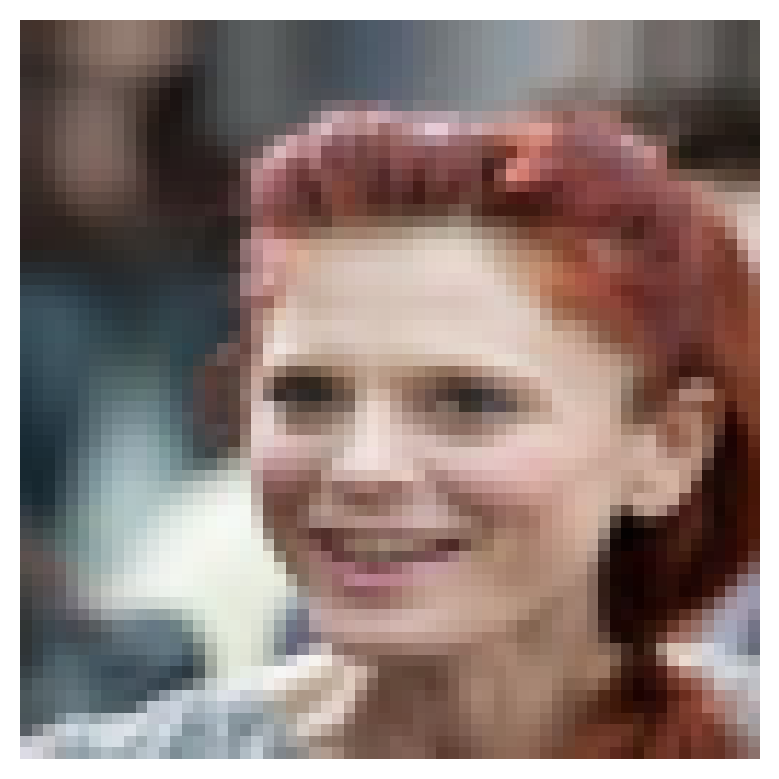

In [5]:
# Example of how to use the function
image = train_data[1]
# print(train_data_path[1])
# left_image, left_label = shift_image(image, 'left')
# right_image, right_label = shift_image(image, 'right')

# image = image.permute(1, 2, 0).numpy()

plot_ddpm_2d_naive_image(image)
# # Display the original and modified images
# plt.figure(figsize=(10, 3))
# plt.subplot(1, 3, 1)
# plt.title('Original')
# plt.imshow(image.squeeze())

# # plt.subplot(1, 3, 2)
# # plt.title('Shifted Left')
# # plt.imshow(left_image.squeeze(), cmap='gray')
# # plt.subplot(1, 3, 3)
# # plt.title('Shifted Right')
# # plt.imshow(right_image.squeeze(), cmap='gray')
# plt.show()
# print(train_data[1])
# print(train_data[1].shape)

### Train 

### uncondition

cuda:1


it:[      0][0.0]% loss:[0.7720]


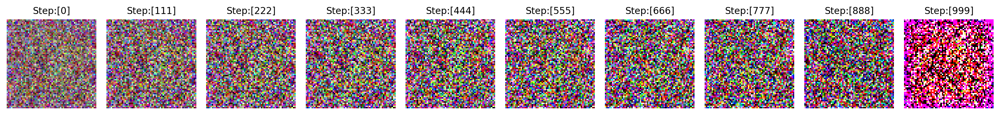

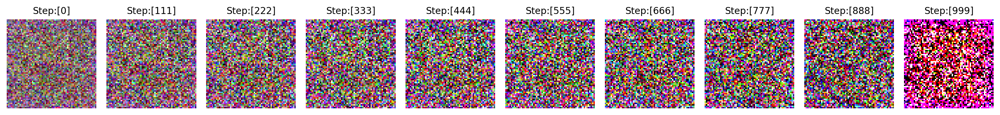

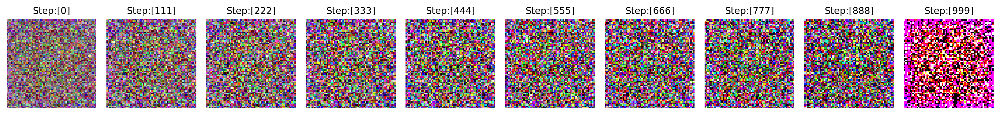

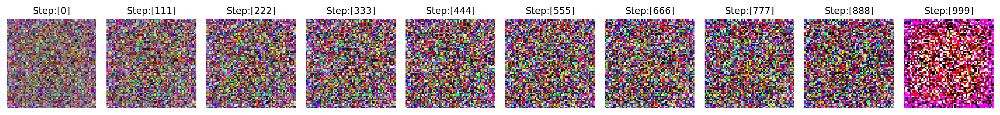

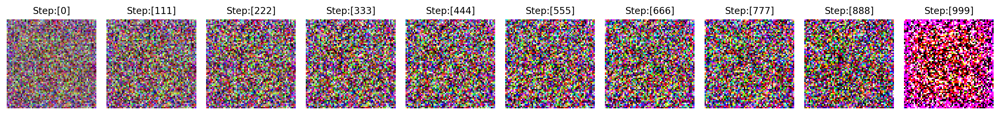

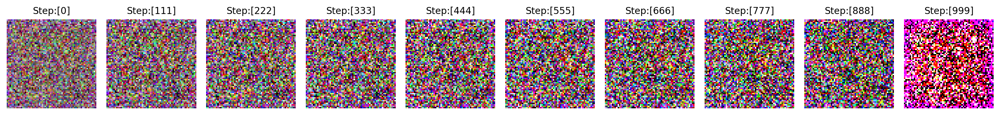

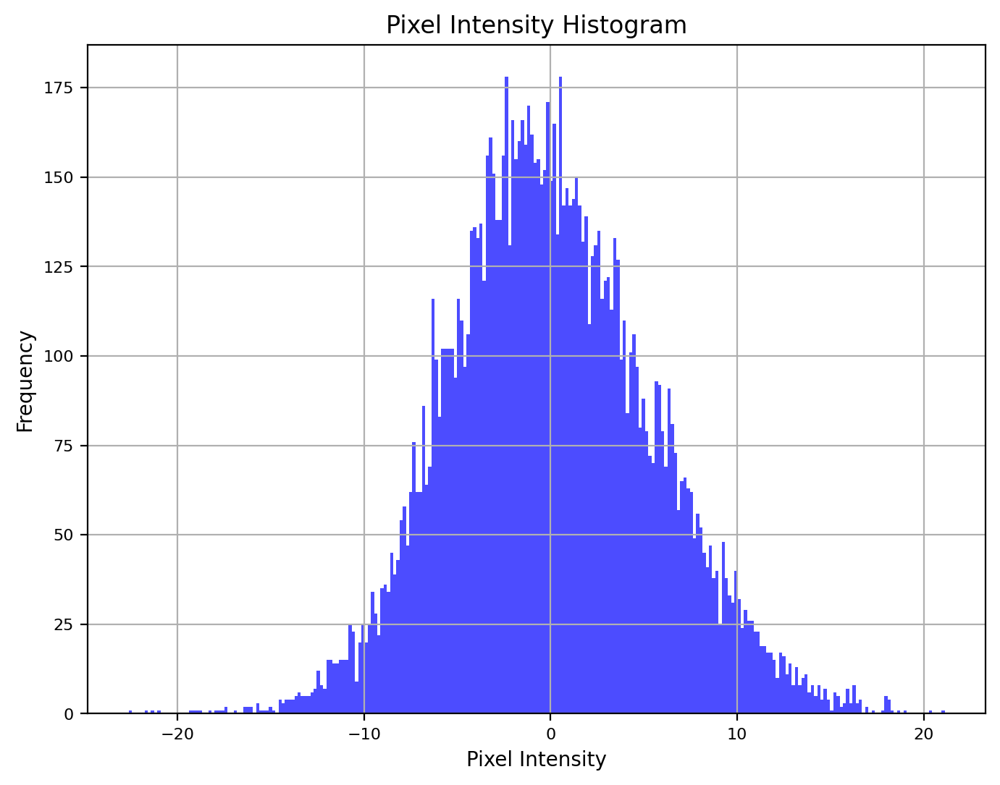

it:[   1000][2.5]% loss:[0.1561]


In [6]:

# Instantiate U-net
model = DiffusionUNetLegacy(
    name                 = 'unet',
    dims                 = 2,
    n_in_channels        = 3,
    n_base_channels      = 64,
    n_emb_dim            = 128,
    n_cond_dim           = 0,
    n_enc_blocks         = 4, # 4 number of encoder blocks
    n_dec_blocks         = 4, # 4 number of decoder blocks
    n_groups             = 16, # group norm paramter
    n_heads              = 4, # number of heads in QKV attention
    actv                 = nn.SiLU(),
    kernel_size          = 3, # kernel size (3)
    padding              = 1, # padding size (1)
    use_attention        = False, # no attention for images
    skip_connection      = True, # additional skip connection
    chnnel_multiples     = (1,2,4,8), # 16,32
    updown_rates         = (1,2,2,2), # 1,2
    use_scale_shift_norm = True,
    device               = device,
) # input:[B x C x W x H] => output:[B x C x W x H]
print(device)
# Configuration
max_iter    = int(4e4)
batch_size  = 64 #32
print_every = 1e3
eval_every  = 2e3

# Loop
model.train()
optm = th.optim.AdamW(params=model.parameters(),lr=1e-4,weight_decay=0.0)
schd = th.optim.lr_scheduler.ExponentialLR(optimizer=optm,gamma=0.99998)
for it in range(max_iter):
    # Zero gradient
    optm.zero_grad()
    # Get batch
    idx = np.random.choice(x_0.shape[0],batch_size)
    x_0_batch = x_0[idx,:,:,:] # [B x C x W x H]
    # Sample time steps
    step_batch = th.randint(0, dc['T'],(batch_size,),device=device).to(th.int64) # [B]
    # Forward diffusion sampling
    x_t_batch,noise = forward_sample(x_0_batch,step_batch,dc) # [B x C x W x H]
    # Noise prediction
    # paritial_embeddings = th.index_select(embedding_vectors, dim=0, index=th.tensor(idx, device=device))
    noise_pred,_ = model(x_t_batch,step_batch) # [B x C x W x H]
    # Compute error
    loss = F.mse_loss(noise,noise_pred)+F.smooth_l1_loss(noise,noise_pred,beta=0.1)
    # Update
    loss.backward()#retain_graph=True
    optm.step()
    schd.step()
    # Print
    if (it%print_every) == 0 or it == (max_iter-1):
        print ("it:[%7d][%.1f]%% loss:[%.4f]"%(it,100*it/max_iter,loss.item()))
    # Evaluate
    if (it%eval_every) == 0 or it == (max_iter-1):
        n_sample = 20
        step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
        x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device)
        # plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=2)
        plot_ddpm_2d_result_image(x_0,step_list_to_append,x_t_list,n_plot=6)

        image_np = x_t_list[-1][-1].cpu().numpy().flatten()
        plt.figure(figsize=(8, 6))
        plt.hist(image_np, bins=256, alpha=0.7, color='blue')
        plt.title('Pixel Intensity Histogram')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()

print ("Done.")

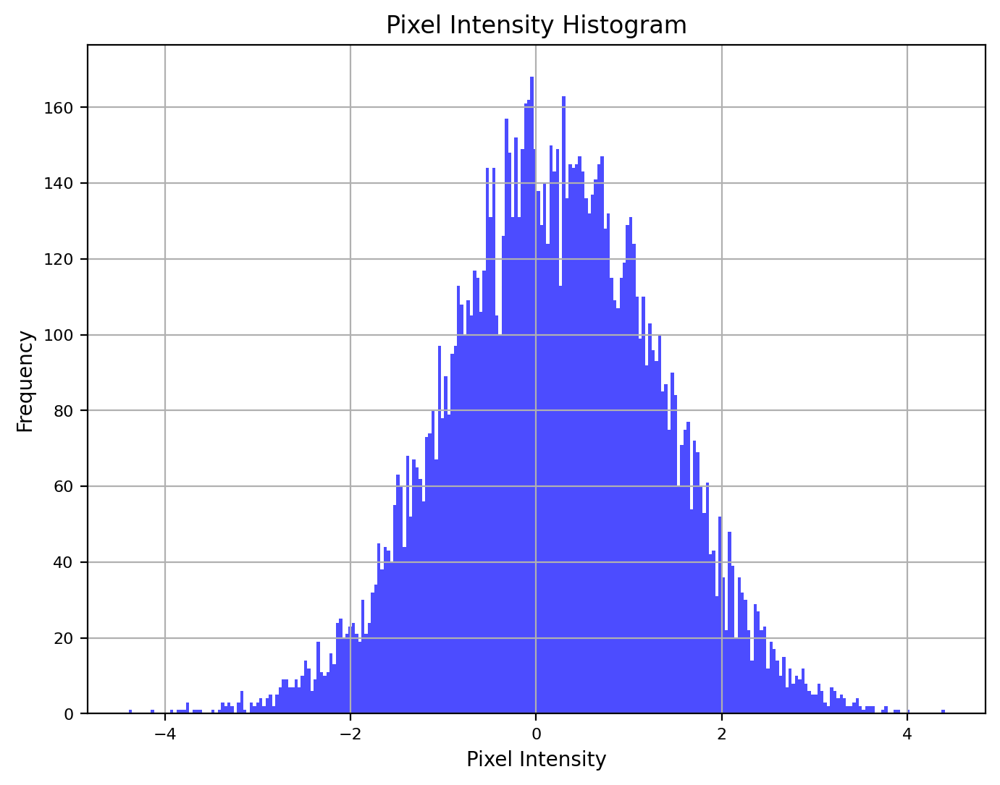

In [ ]:


image_np = x_t_list[-1][-1].cpu().numpy().flatten()

plt.figure(figsize=(8, 6))
plt.hist(image_np, bins=256, alpha=0.7, color='blue')
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [ ]:
import torch
from datetime import datetime

# 현재 날짜와 시간 가져오기
now = datetime.now()

# "YYYYMMDD_HHMMSS" 형식으로 포맷팅
formatted_now = now.strftime("%Y%m%d_%H%M%S")

# 모델과 옵티마이저 상태를 저장할 경로
save_path = f'result/celebA_uncondition_{formatted_now}.pth'

# 모델 및 옵티마이저 상태를 딕셔너리로 저장
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optm.state_dict(),
    'scheduler_state_dict': schd.state_dict(),
    'epoch': it,
    'loss': loss.item()
}, save_path)

print(f'Model saved to {save_path}')

Model saved to result/celebA_uncondition_20240617_163039.pth


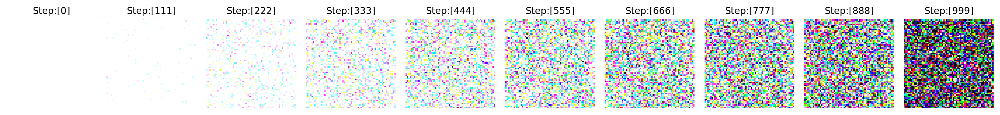

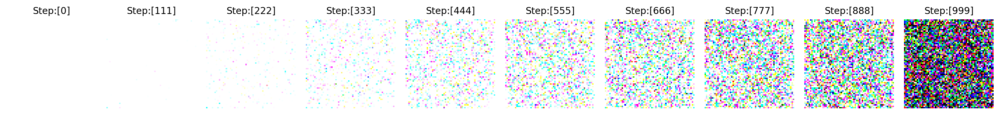

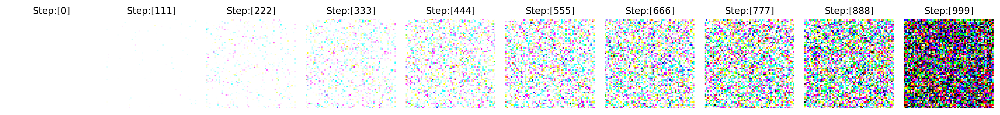

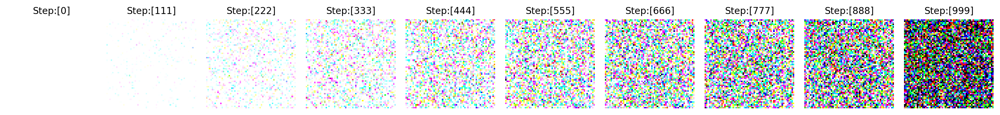

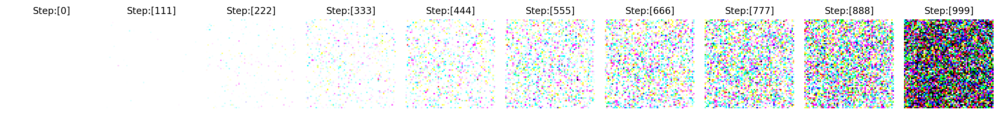

...

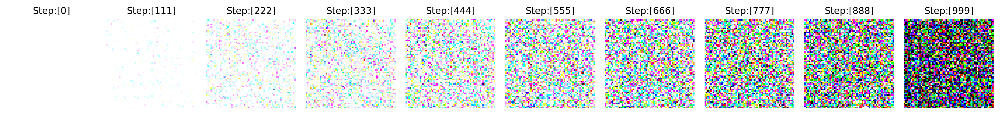

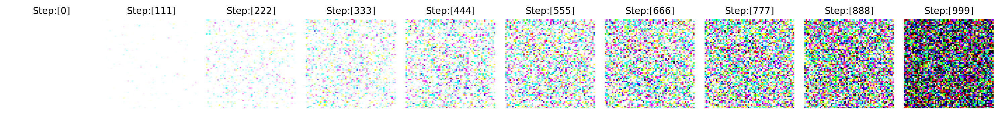

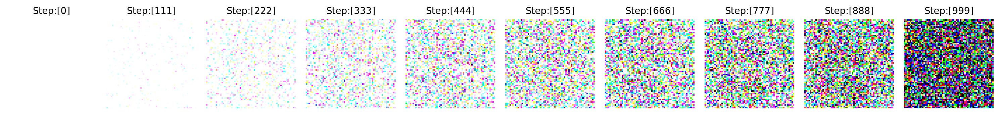

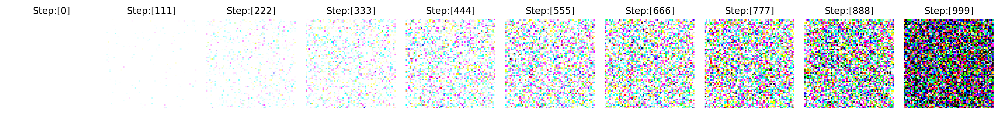

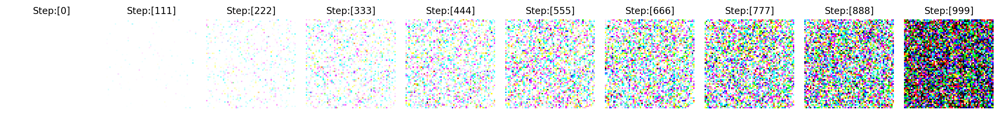

In [ ]:
n_sample = 200
step_list_to_append = np.linspace(0,999,10).astype(np.int64) # save 10 x_ts
x_t_list = eval_ddpm_2d(model,dc,n_sample,x_0,step_list_to_append,device)
# plot_ddpm_2d_result(x_0,step_list_to_append,x_t_list,n_plot=n_sample)
plot_ddpm_2d_result_image(x_0,step_list_to_append,x_t_list,n_plot=80)